# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [5]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [6]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [19]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [20]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [32]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(size = (n_samples, z_dim), device = device)
    #### END CODE HERE ####

In [33]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [34]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope = 0.2)
        #### END CODE HERE ####
    )

In [35]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [36]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [37]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [38]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [39]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [58]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device = device)
    gen_image = gen(fake_noise)
    disc_fake_pred = disc(gen_image.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [59]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [60]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise_images = get_noise(num_images, z_dim, device)
    gen_images = gen(noise_images)
    disc_pred = disc(gen_images)
    gen_loss = criterion(disc_pred, torch.ones_like(disc_pred))
    #### END CODE HERE ####
    return gen_loss

In [61]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.42918327534199, discriminator loss: 0.42983052188158094


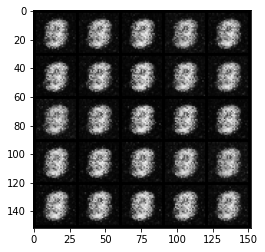

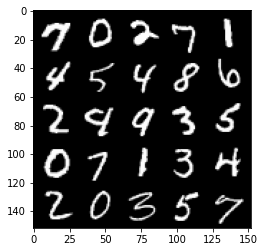

Step 1000: Generator loss: 1.7127319564819334, discriminator loss: 0.2995162858963015


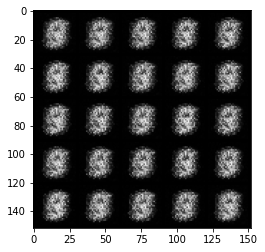

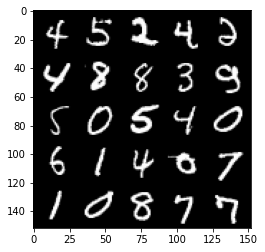

Step 1500: Generator loss: 2.0502914488315582, discriminator loss: 0.1684953801929949


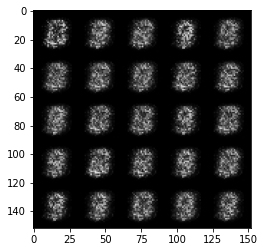

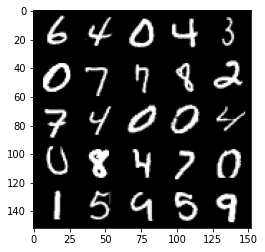

Step 2000: Generator loss: 1.6837776460647575, discriminator loss: 0.2279708740413191


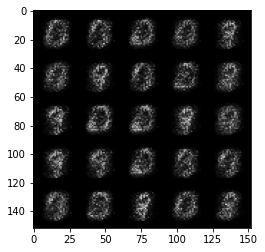

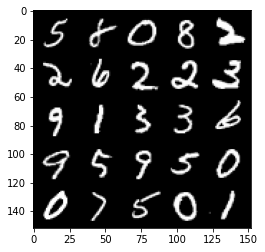

Step 2500: Generator loss: 1.484905588150023, discriminator loss: 0.25982486698031415


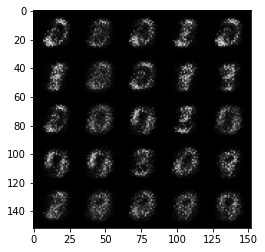

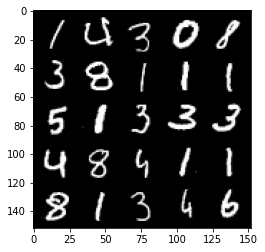

Step 3000: Generator loss: 1.72366584944725, discriminator loss: 0.21180036407709124


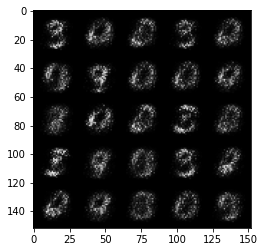

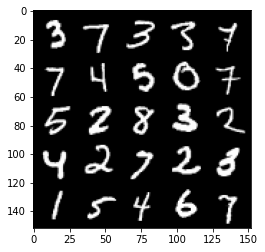

Step 3500: Generator loss: 2.1210282850265503, discriminator loss: 0.15790663939714447


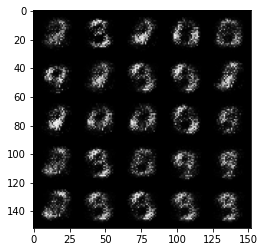

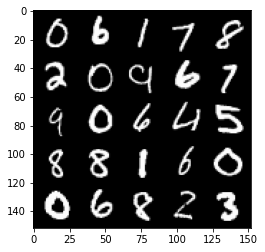

Step 4000: Generator loss: 2.5473029847145088, discriminator loss: 0.13202203540503993


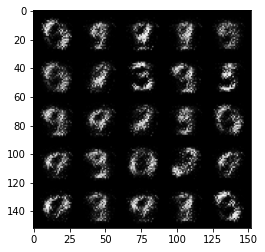

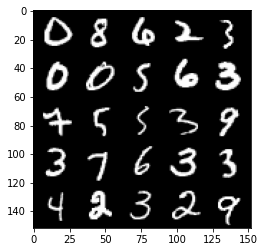

Step 4500: Generator loss: 2.800323622703552, discriminator loss: 0.11689449402689929


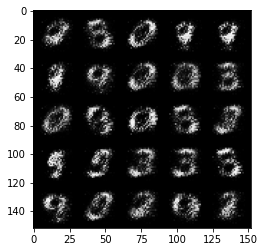

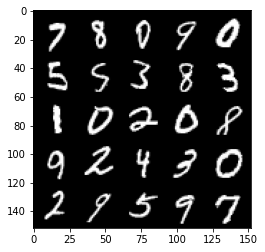

Step 5000: Generator loss: 3.231419585704806, discriminator loss: 0.09618825535476216


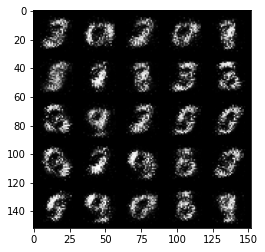

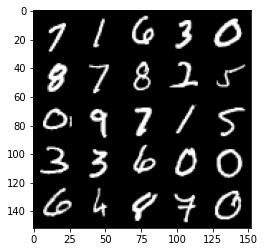

Step 5500: Generator loss: 3.416183673858643, discriminator loss: 0.08472864051908253


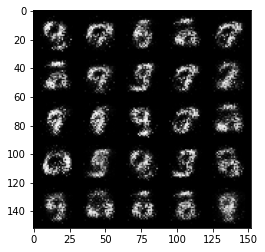

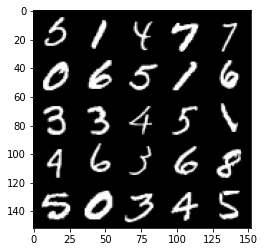

Step 6000: Generator loss: 3.719407375812533, discriminator loss: 0.07672856521606444


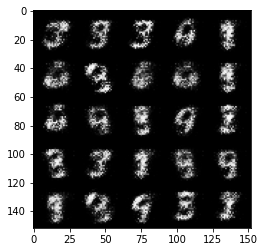

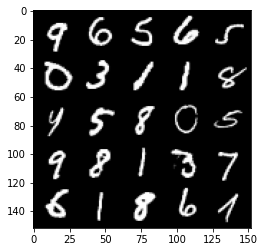

Step 6500: Generator loss: 3.738417080879214, discriminator loss: 0.0724196582287549


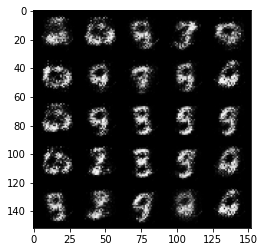

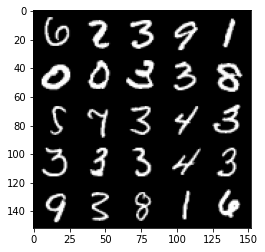

Step 7000: Generator loss: 3.9963553056716967, discriminator loss: 0.058959916964173374


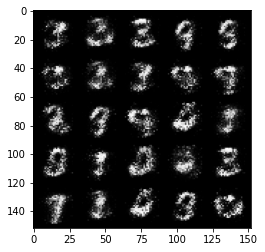

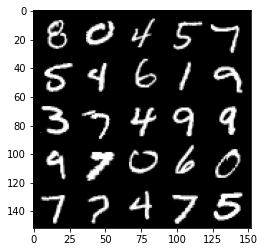

Step 7500: Generator loss: 3.9892374634742755, discriminator loss: 0.06143800886720417


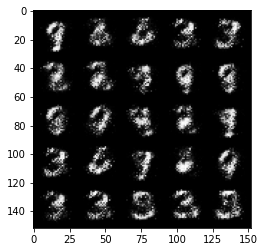

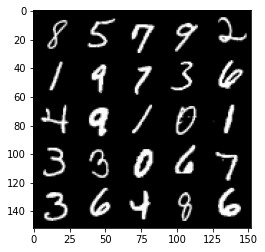

Step 8000: Generator loss: 3.9297816290855443, discriminator loss: 0.06424048747122289


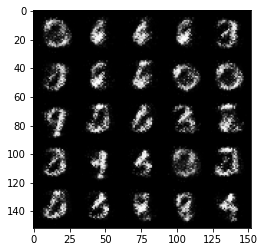

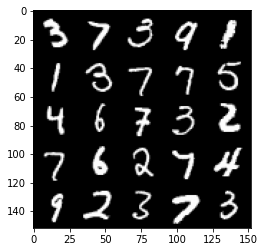

Step 8500: Generator loss: 4.149174534797669, discriminator loss: 0.05329705137759447


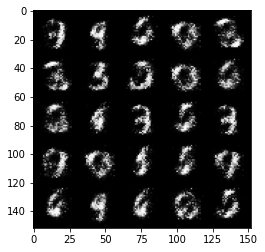

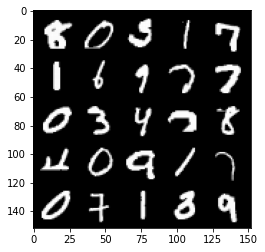

Step 9000: Generator loss: 4.316105431079868, discriminator loss: 0.06306939886510371


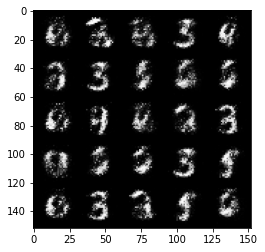

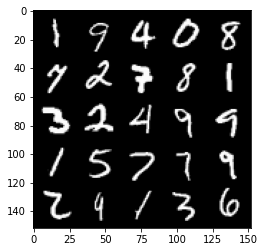

Step 9500: Generator loss: 4.223463609695432, discriminator loss: 0.07121540158987046


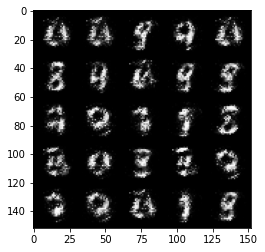

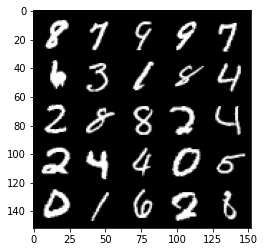

Step 10000: Generator loss: 4.0181645460128825, discriminator loss: 0.07907842312753197


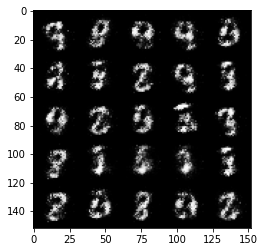

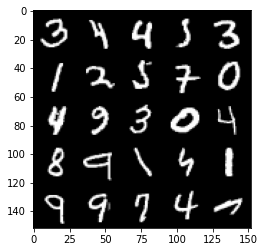

Step 10500: Generator loss: 3.7759067144393894, discriminator loss: 0.08791280901432041


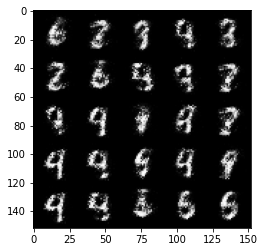

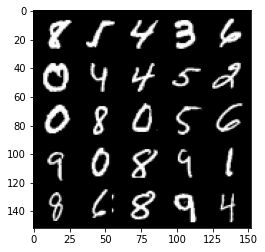

Step 11000: Generator loss: 3.7724942202568017, discriminator loss: 0.08509329793602237


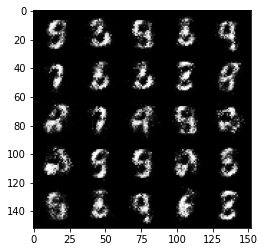

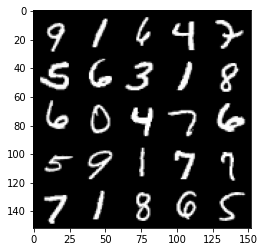

Step 11500: Generator loss: 3.8691935429573068, discriminator loss: 0.0826528401374818


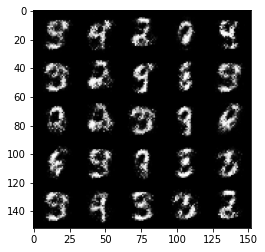

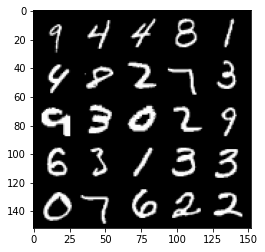

Step 12000: Generator loss: 3.788225696563718, discriminator loss: 0.08405356255173682


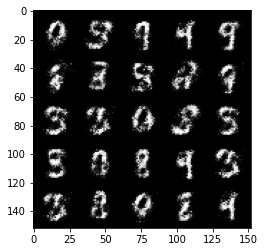

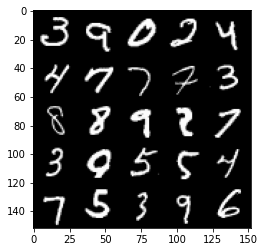

Step 12500: Generator loss: 3.8569456191062916, discriminator loss: 0.08813562285155056


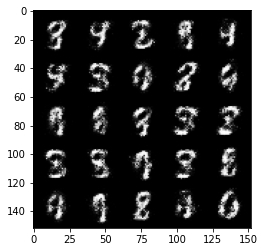

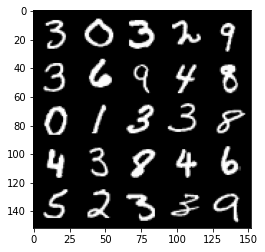

Step 13000: Generator loss: 3.816954478263856, discriminator loss: 0.09313897053897377


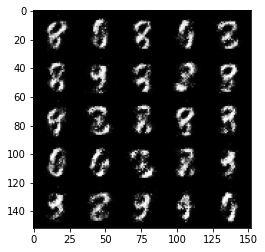

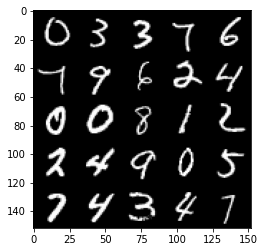

Step 13500: Generator loss: 3.8286354761123653, discriminator loss: 0.10527442005276688


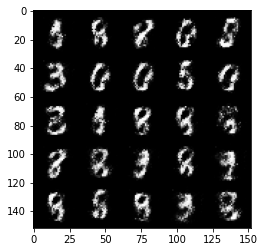

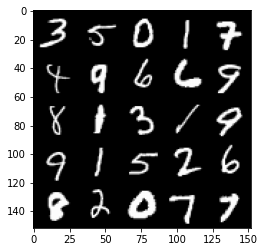

Step 14000: Generator loss: 3.692891021251683, discriminator loss: 0.10811044393479818


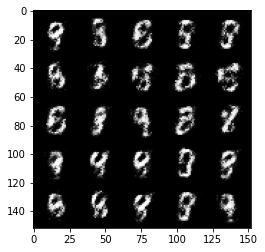

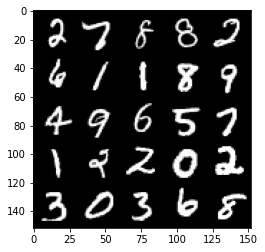

Step 14500: Generator loss: 3.5182091798782382, discriminator loss: 0.1262298092693091


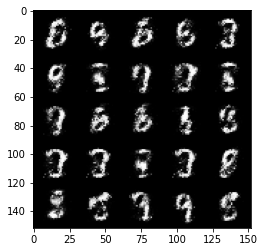

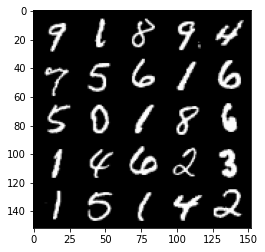

Step 15000: Generator loss: 3.507257800102235, discriminator loss: 0.11149056176096203


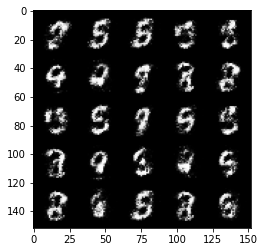

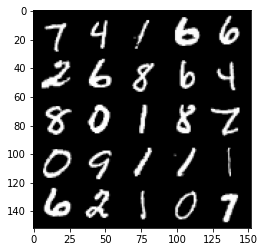

Step 15500: Generator loss: 3.7221485891342168, discriminator loss: 0.10459714107215401


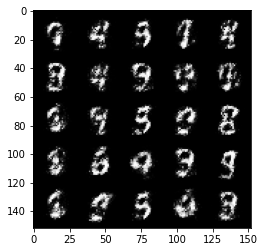

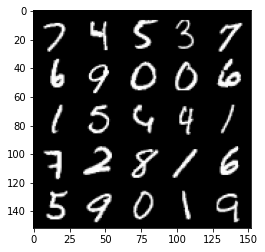

Step 16000: Generator loss: 3.6154144620895368, discriminator loss: 0.12228081376850601


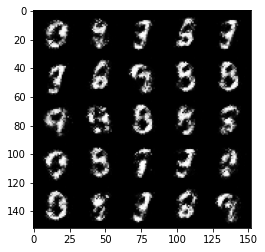

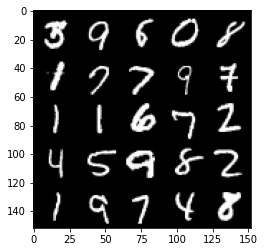

Step 16500: Generator loss: 3.525131400108334, discriminator loss: 0.12663673993200067


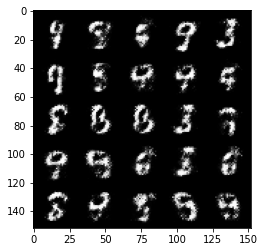

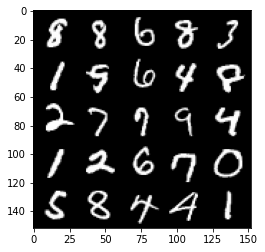

Step 17000: Generator loss: 3.547895187854767, discriminator loss: 0.14079950538277633


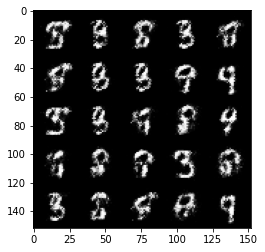

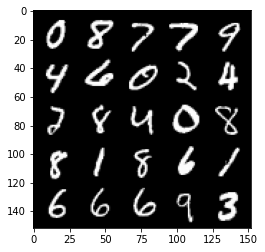

Step 17500: Generator loss: 3.3123488602638256, discriminator loss: 0.16337673266232028


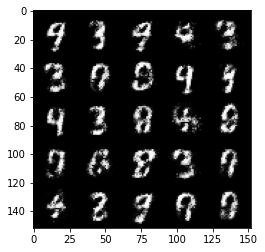

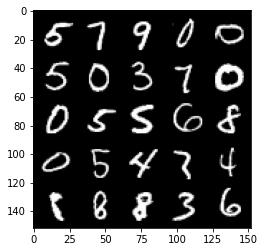

Step 18000: Generator loss: 3.3262850017547647, discriminator loss: 0.14316194696724413


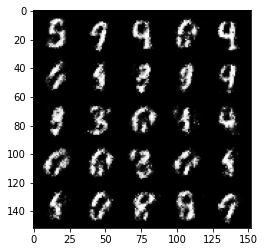

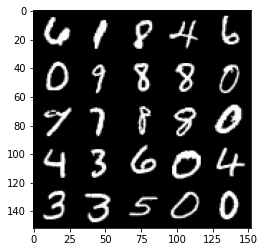

Step 18500: Generator loss: 3.3557834548950183, discriminator loss: 0.15362243613600726


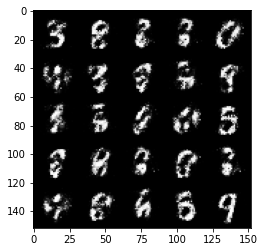

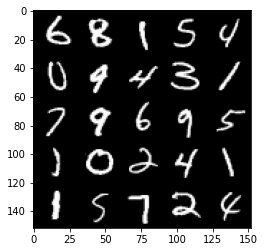

Step 19000: Generator loss: 3.0703178553581254, discriminator loss: 0.1610214848071337


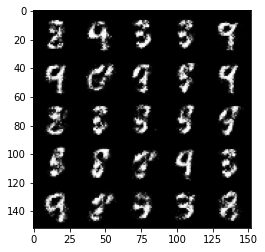

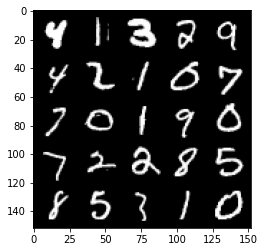

Step 19500: Generator loss: 3.1410337572097724, discriminator loss: 0.16291048792004562


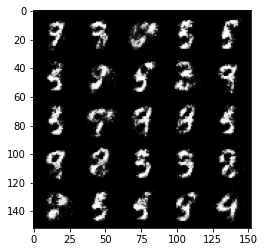

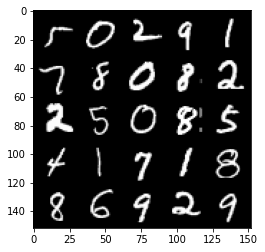

Step 20000: Generator loss: 3.313812657356261, discriminator loss: 0.14491720715165135


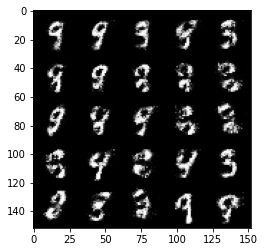

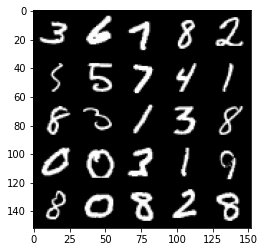

Step 20500: Generator loss: 2.9987975988388054, discriminator loss: 0.17621096624434


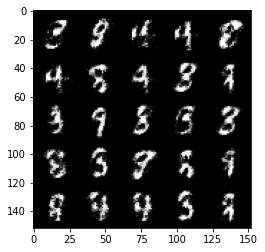

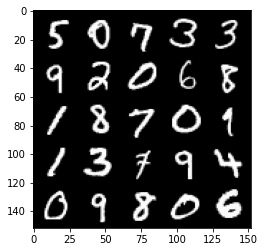

Step 21000: Generator loss: 2.9847365260124183, discriminator loss: 0.16633709301054475


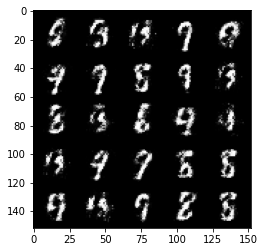

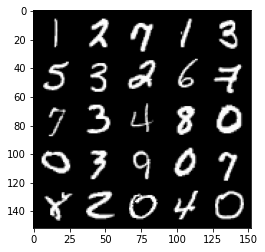

Step 21500: Generator loss: 3.077131955146792, discriminator loss: 0.1763908572047948


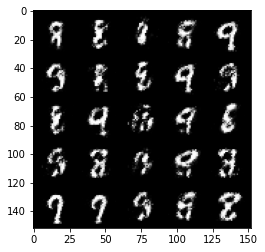

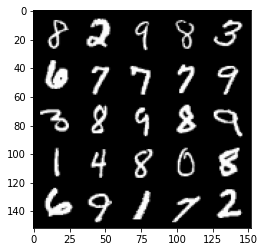

Step 22000: Generator loss: 2.9486912045478806, discriminator loss: 0.19323894624412075


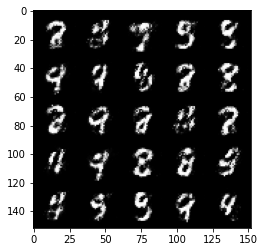

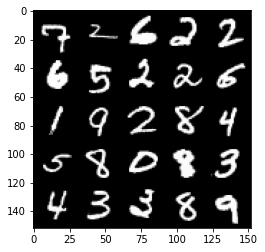

Step 22500: Generator loss: 2.6736465706825263, discriminator loss: 0.23190878689289104


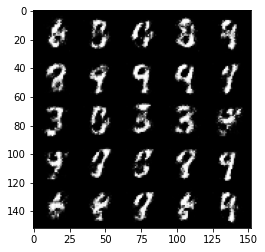

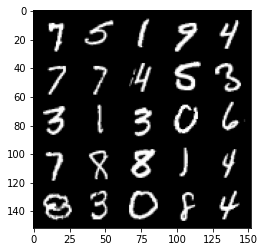

Step 23000: Generator loss: 2.718841937541962, discriminator loss: 0.2047768664509057


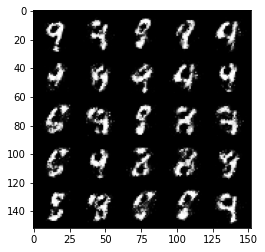

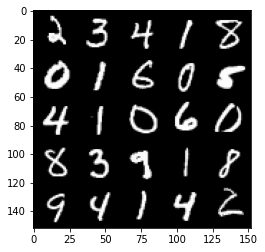

Step 23500: Generator loss: 3.0294184379577627, discriminator loss: 0.16555802945792672


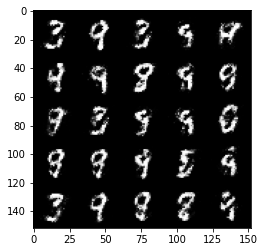

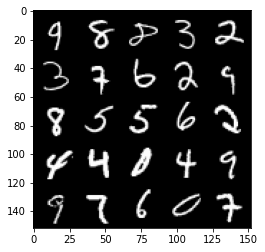

Step 24000: Generator loss: 2.932997140407563, discriminator loss: 0.18606162847578514


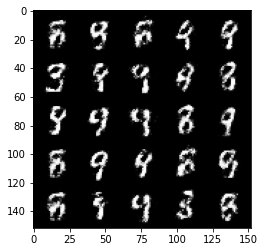

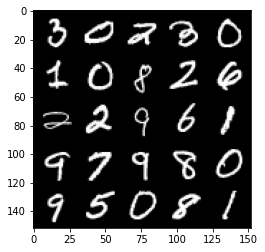

Step 24500: Generator loss: 2.8335634808540324, discriminator loss: 0.2016824563145638


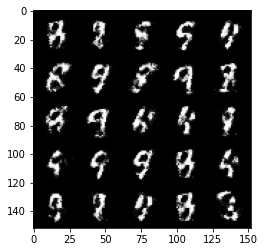

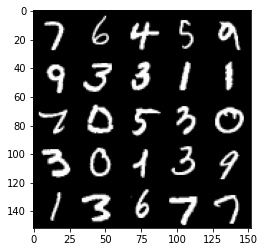

Step 25000: Generator loss: 2.8680355749130286, discriminator loss: 0.20489310672879235


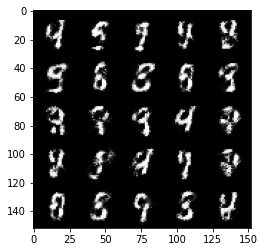

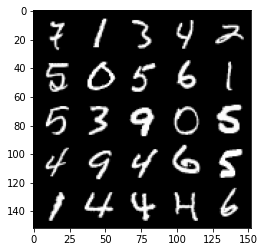

Step 25500: Generator loss: 2.7298318557739254, discriminator loss: 0.21601901209354393


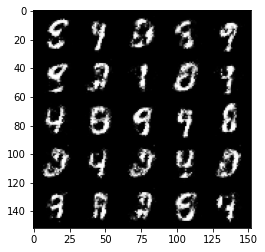

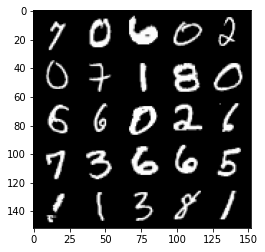

Step 26000: Generator loss: 2.7903940510749843, discriminator loss: 0.2207952283322811


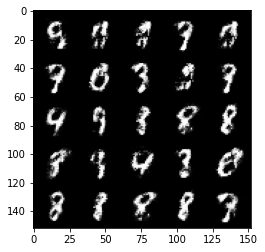

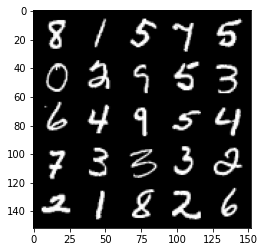

Step 26500: Generator loss: 2.5483950567245475, discriminator loss: 0.24712209838628768


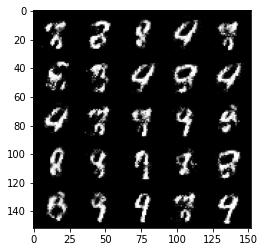

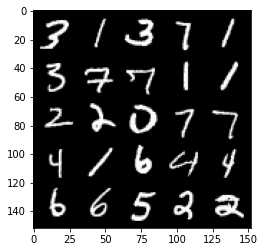

Step 27000: Generator loss: 2.5844929041862468, discriminator loss: 0.22508794239163382


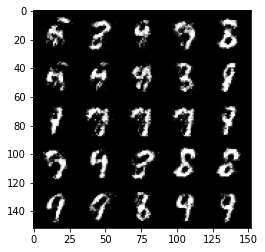

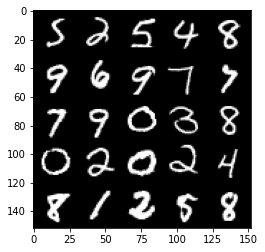

Step 27500: Generator loss: 2.681699985980989, discriminator loss: 0.20397404232621194


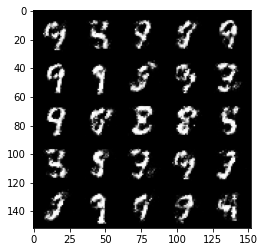

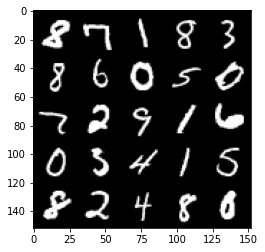

Step 28000: Generator loss: 2.695767580986023, discriminator loss: 0.20950950682163236


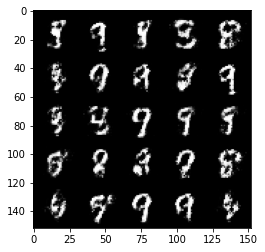

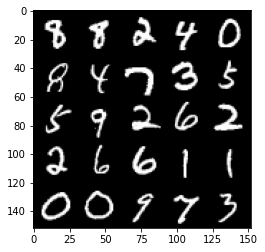

Step 28500: Generator loss: 2.6009864807128906, discriminator loss: 0.2370447773337363


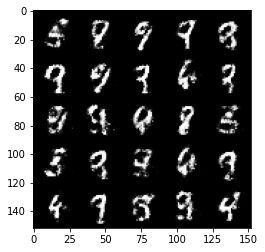

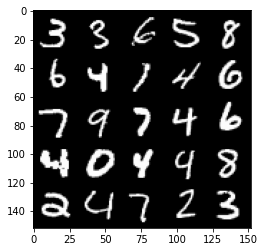

Step 29000: Generator loss: 2.648963334083558, discriminator loss: 0.2178760289251804


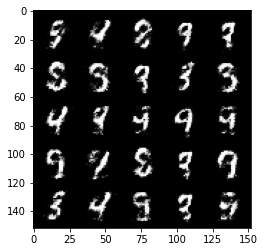

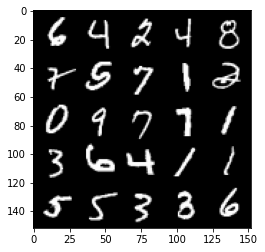

Step 29500: Generator loss: 2.7749781346321094, discriminator loss: 0.21739538884162887


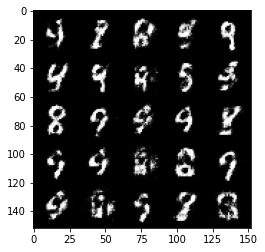

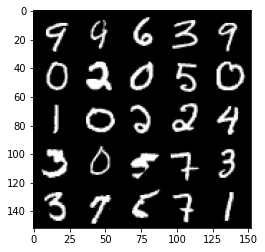

Step 30000: Generator loss: 2.612090227127074, discriminator loss: 0.22592396050691607


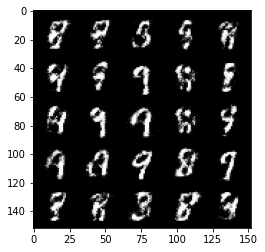

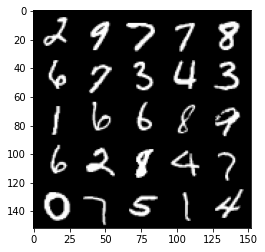

Step 30500: Generator loss: 2.7007444128990206, discriminator loss: 0.20129716219007976


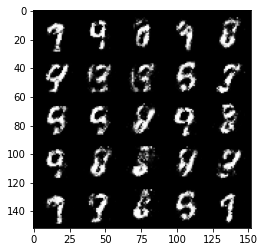

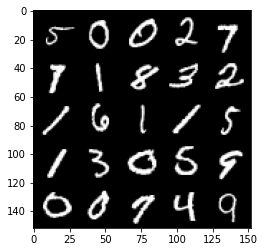

Step 31000: Generator loss: 2.6172093729972845, discriminator loss: 0.22291094478964807


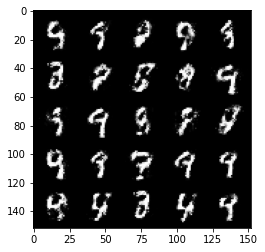

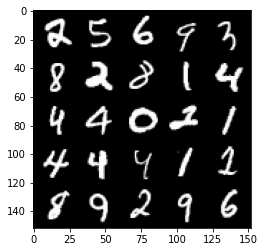

Step 31500: Generator loss: 2.5586341004371644, discriminator loss: 0.23112617918849004


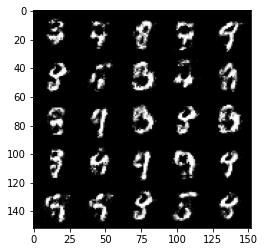

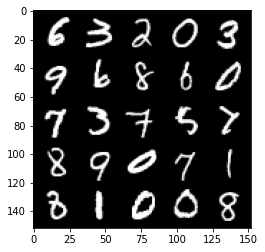

Step 32000: Generator loss: 2.5209200842380532, discriminator loss: 0.23530729246139517


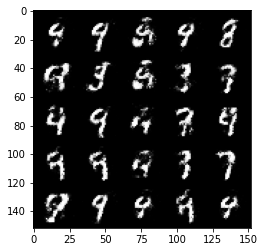

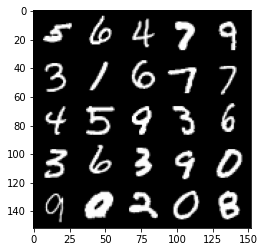

Step 32500: Generator loss: 2.6057841758728024, discriminator loss: 0.2162284108698366


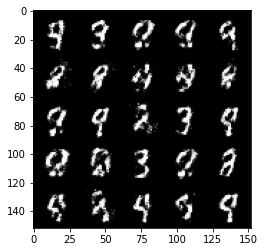

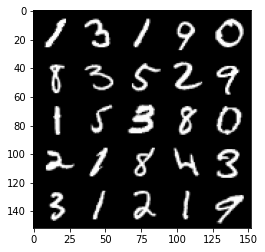

Step 33000: Generator loss: 2.590735962390897, discriminator loss: 0.23787280124425877


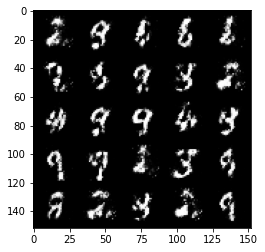

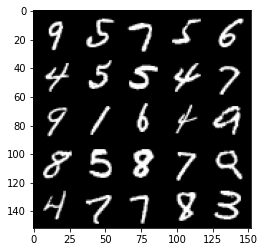

Step 33500: Generator loss: 2.5993212738037106, discriminator loss: 0.22854127389192577


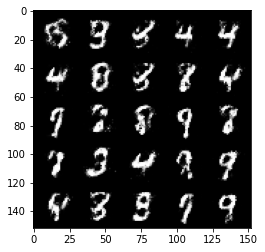

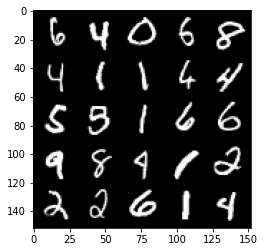

Step 34000: Generator loss: 2.4833588032722473, discriminator loss: 0.2607622485756876


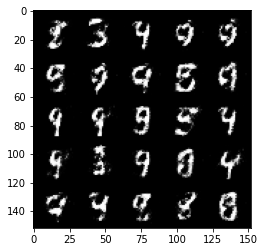

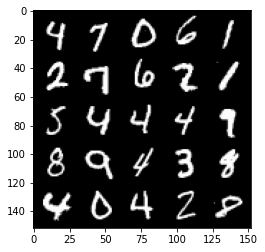

Step 34500: Generator loss: 2.409255261182783, discriminator loss: 0.2654354545176033


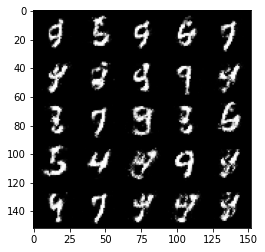

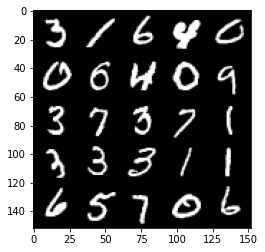

Step 35000: Generator loss: 2.339659585237502, discriminator loss: 0.26509245243668544


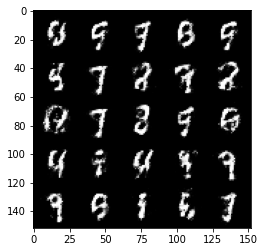

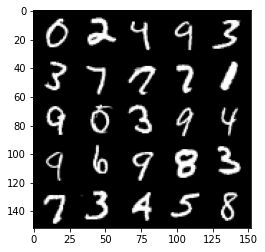

Step 35500: Generator loss: 2.322541529893878, discriminator loss: 0.280004332959652


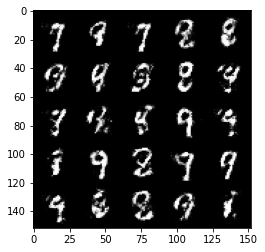

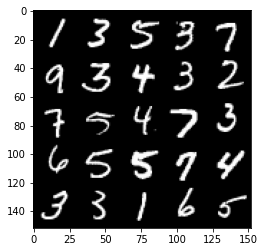

Step 36000: Generator loss: 2.325797339677809, discriminator loss: 0.26090999746322635


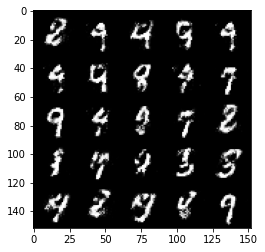

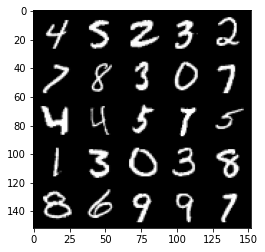

Step 36500: Generator loss: 2.3948040916919675, discriminator loss: 0.24315385422110558


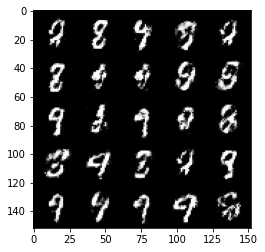

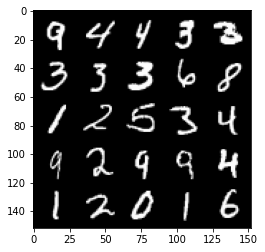

Step 37000: Generator loss: 2.4050095410346994, discriminator loss: 0.2482825709879399


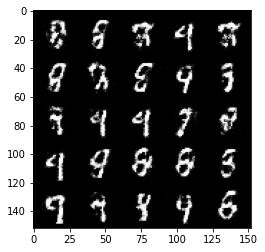

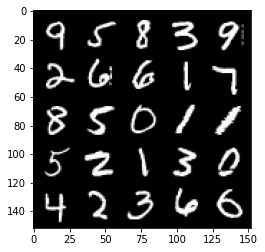

Step 37500: Generator loss: 2.309879442453384, discriminator loss: 0.2757632814943792


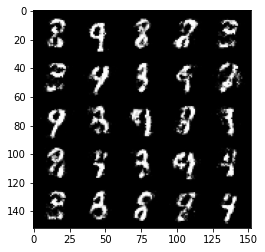

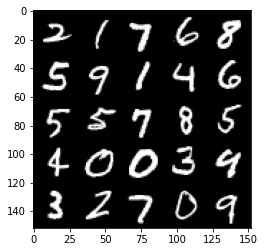

Step 38000: Generator loss: 2.340361048460005, discriminator loss: 0.2659767503440382


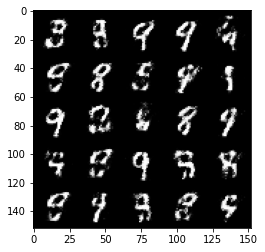

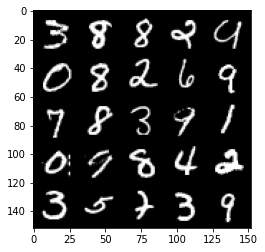

Step 38500: Generator loss: 2.3128678390979767, discriminator loss: 0.2894369902014732


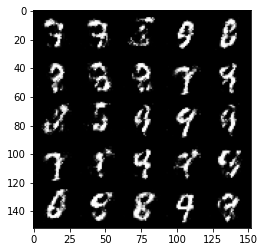

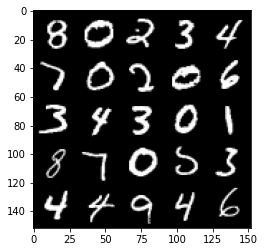

Step 39000: Generator loss: 2.189739998102188, discriminator loss: 0.29682243970036515


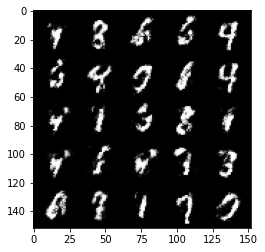

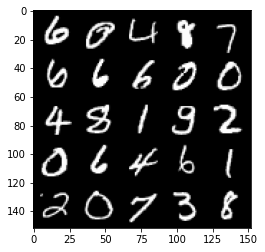

Step 39500: Generator loss: 2.1757268791198725, discriminator loss: 0.298558566868305


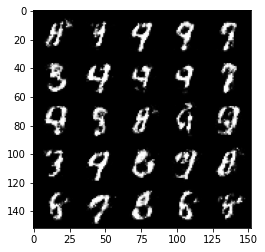

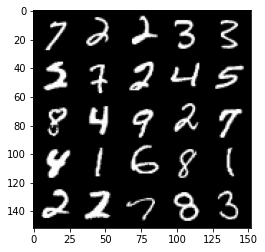

Step 40000: Generator loss: 2.2277859771251673, discriminator loss: 0.2848718485236168


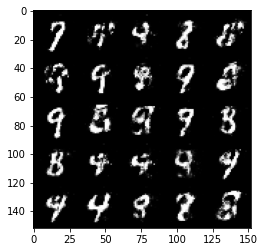

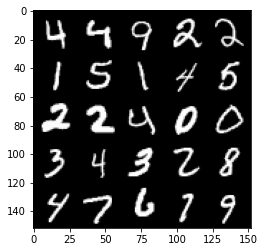

Step 40500: Generator loss: 2.1131369669437396, discriminator loss: 0.3107761377990246


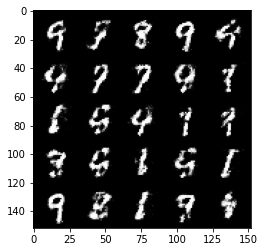

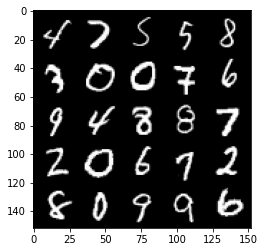

Step 41000: Generator loss: 2.117649318218231, discriminator loss: 0.29884281656146056


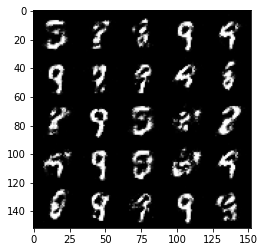

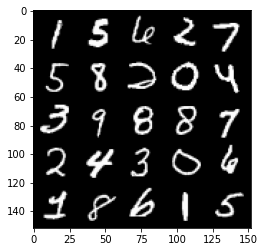

Step 41500: Generator loss: 2.24369078540802, discriminator loss: 0.2765119949281215


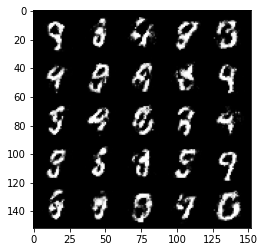

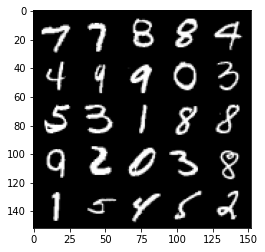

Step 42000: Generator loss: 2.2625874569416053, discriminator loss: 0.27215569376945503


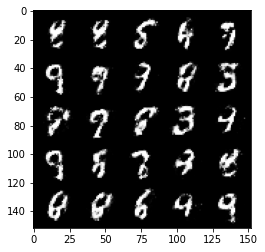

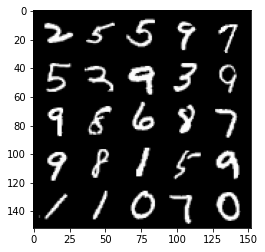

Step 42500: Generator loss: 2.193661742687225, discriminator loss: 0.2880442125499246


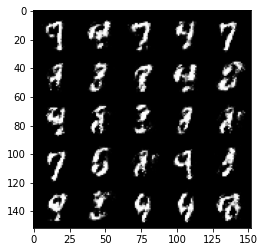

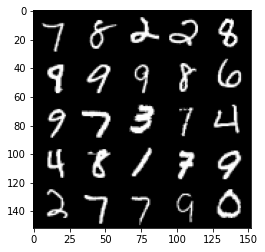

Step 43000: Generator loss: 2.046038235187531, discriminator loss: 0.3112610894441605


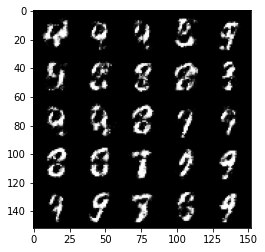

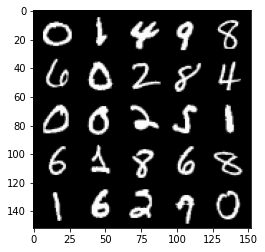

Step 43500: Generator loss: 1.9990752980709081, discriminator loss: 0.3292922731339931


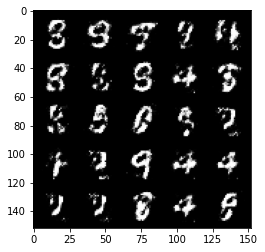

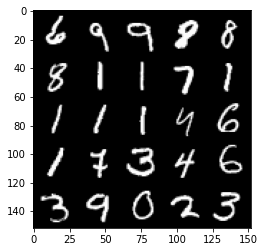

Step 44000: Generator loss: 2.045152473211289, discriminator loss: 0.29933300912380195


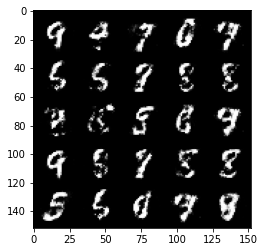

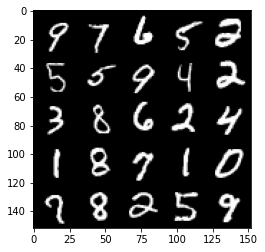

Step 44500: Generator loss: 1.979140142440797, discriminator loss: 0.3230150283873084


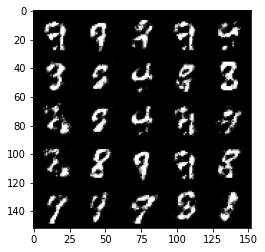

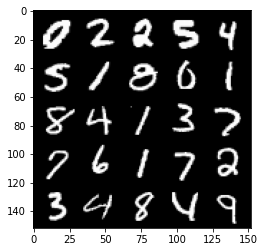

Step 45000: Generator loss: 2.0365852491855607, discriminator loss: 0.3117265890538692


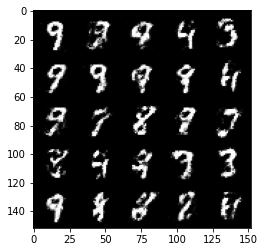

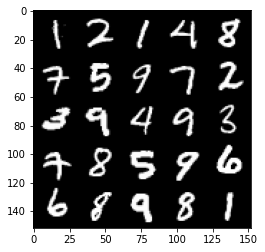

Step 45500: Generator loss: 1.9629650070667268, discriminator loss: 0.3343323003947735


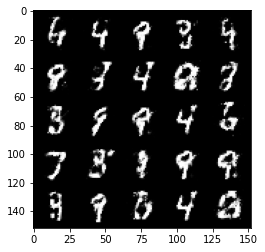

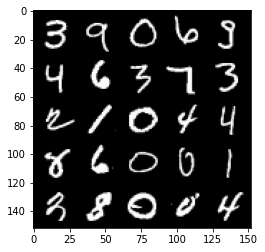

Step 46000: Generator loss: 1.9950136699676515, discriminator loss: 0.309637294381857


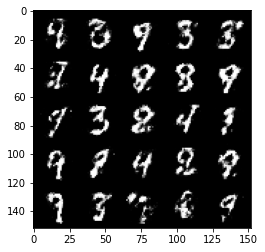

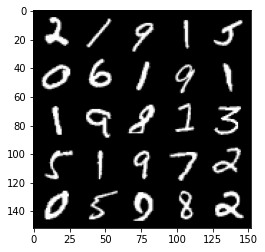

Step 46500: Generator loss: 1.9924800312519073, discriminator loss: 0.33252609401941285


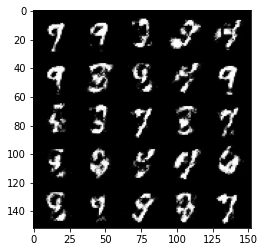

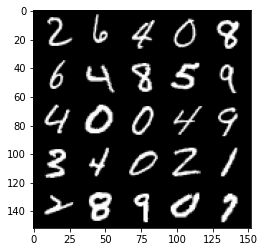

Step 47000: Generator loss: 1.9597634267807005, discriminator loss: 0.33208279597759255


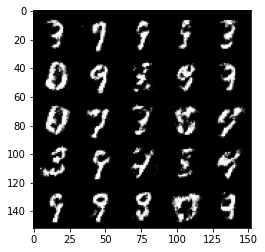

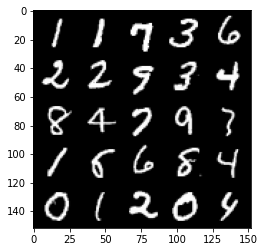

Step 47500: Generator loss: 2.0483858945369726, discriminator loss: 0.310901523798704


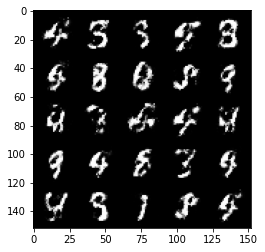

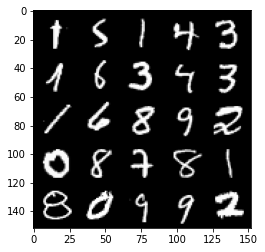

Step 48000: Generator loss: 2.039730181455611, discriminator loss: 0.30648639065027217


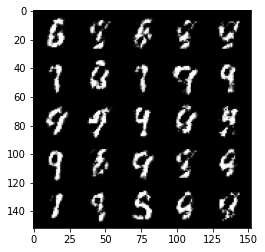

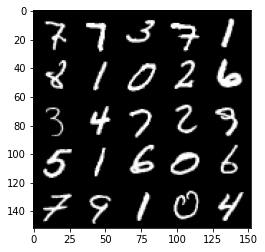

Step 48500: Generator loss: 2.1099310483932476, discriminator loss: 0.28816662028431905


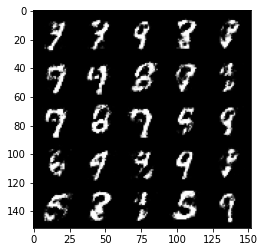

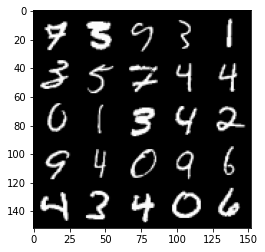

Step 49000: Generator loss: 2.217749686956404, discriminator loss: 0.27435085284709937


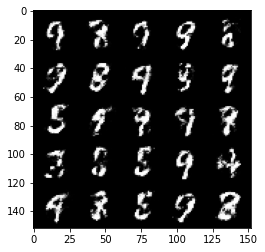

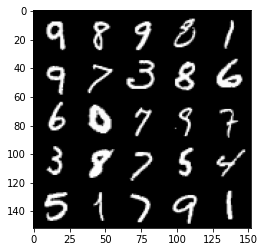

Step 49500: Generator loss: 1.9348002281188958, discriminator loss: 0.3413556373119354


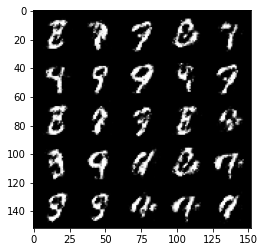

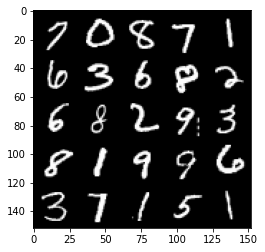

Step 50000: Generator loss: 1.9362355635166169, discriminator loss: 0.3281073329150676


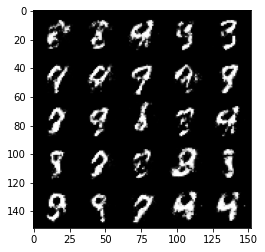

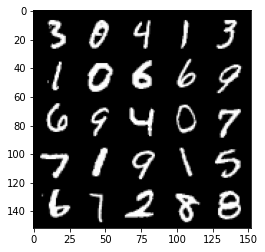

Step 50500: Generator loss: 1.9659083070754997, discriminator loss: 0.32785998213291156


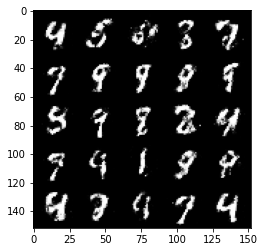

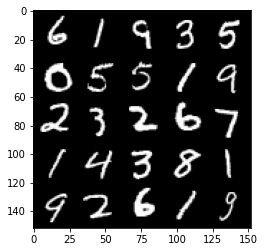

Step 51000: Generator loss: 1.936599905252457, discriminator loss: 0.3288040297031401


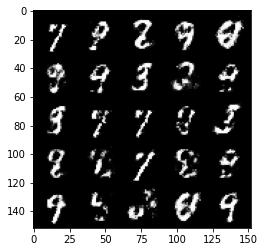

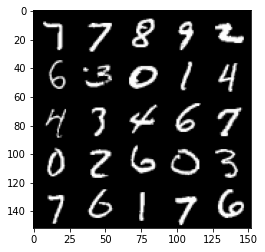

Step 51500: Generator loss: 1.8828949034214013, discriminator loss: 0.34620392712950687


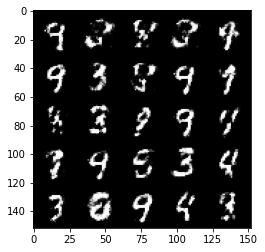

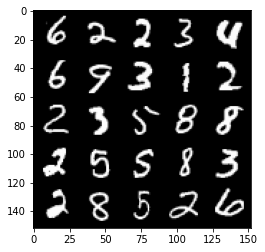

Step 52000: Generator loss: 1.8560218410491953, discriminator loss: 0.34236199548840496


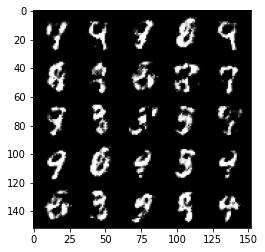

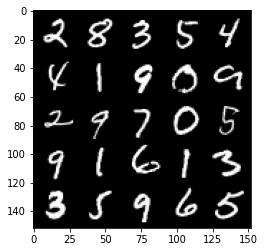

Step 52500: Generator loss: 1.916846672534943, discriminator loss: 0.3388149963021282


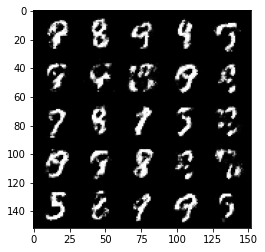

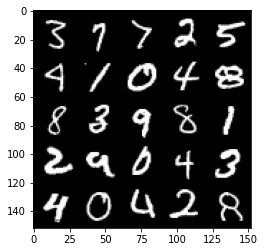

Step 53000: Generator loss: 1.8659362685680383, discriminator loss: 0.3438536661565302


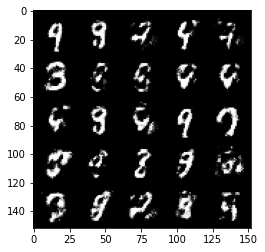

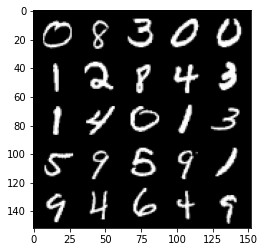

Step 53500: Generator loss: 1.8670469658374804, discriminator loss: 0.3412268487811087


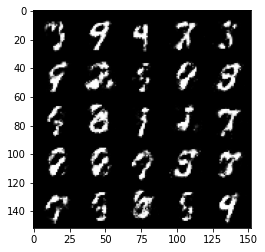

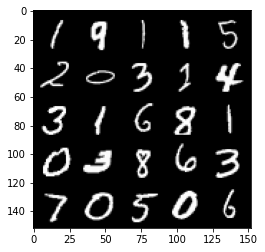

Step 54000: Generator loss: 1.9004946405887608, discriminator loss: 0.3419237318634985


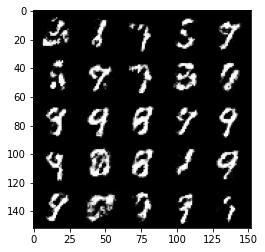

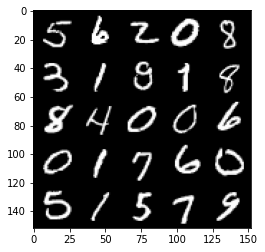

Step 54500: Generator loss: 1.9035128173828104, discriminator loss: 0.33047062921524045


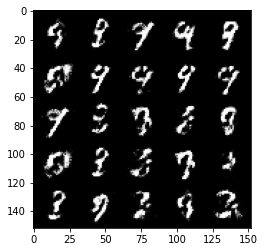

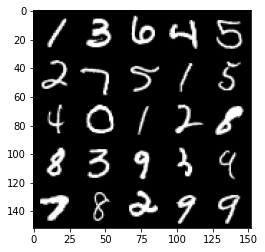

Step 55000: Generator loss: 1.8806054716110239, discriminator loss: 0.3461871336698531


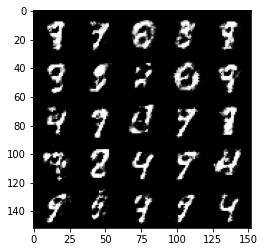

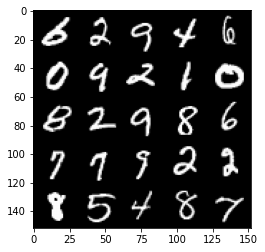

Step 55500: Generator loss: 1.8603353812694545, discriminator loss: 0.3464981119930744


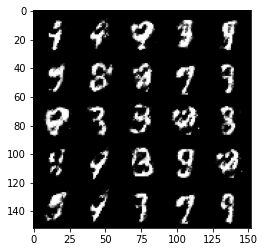

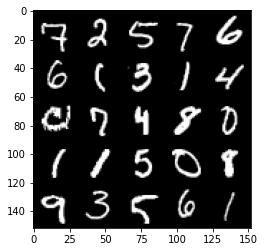

Step 56000: Generator loss: 1.9068484821319578, discriminator loss: 0.3437508999407293


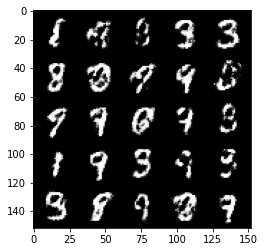

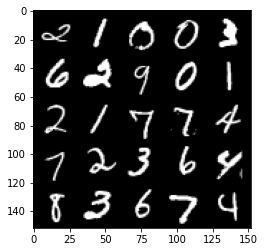

Step 56500: Generator loss: 1.7739357459545135, discriminator loss: 0.3668273804187771


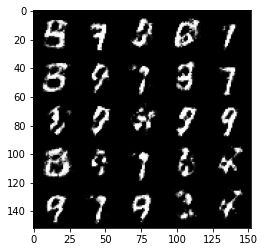

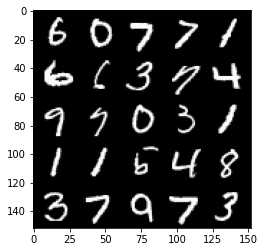

Step 57000: Generator loss: 1.8956139850616454, discriminator loss: 0.330255697786808


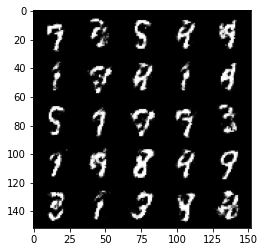

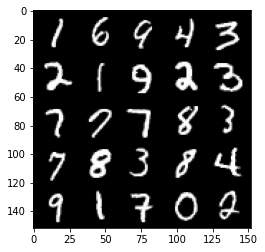

Step 57500: Generator loss: 1.8039008536338814, discriminator loss: 0.3594004018306735


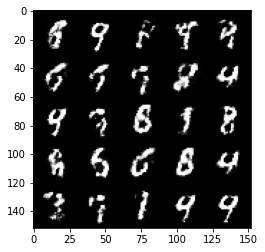

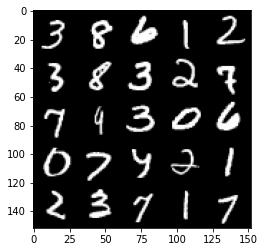

Step 58000: Generator loss: 1.6946023046970373, discriminator loss: 0.3966922746300696


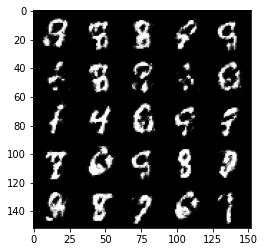

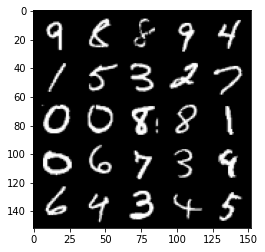

Step 58500: Generator loss: 1.717606761932375, discriminator loss: 0.3681554673612116


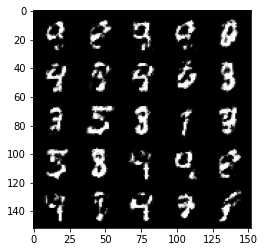

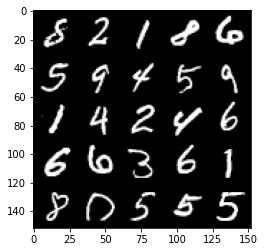

Step 59000: Generator loss: 1.7695044960975654, discriminator loss: 0.3589722295999533


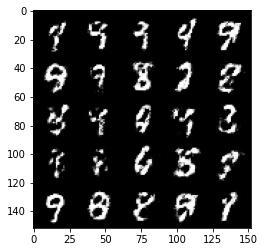

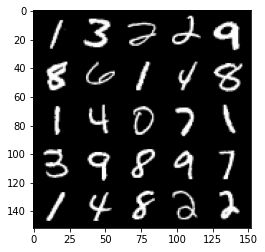

Step 59500: Generator loss: 1.7970194549560548, discriminator loss: 0.3586926723122597


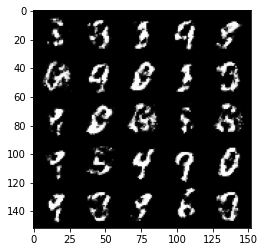

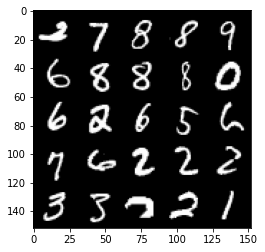

Step 60000: Generator loss: 1.7197338993549338, discriminator loss: 0.37977604687213934


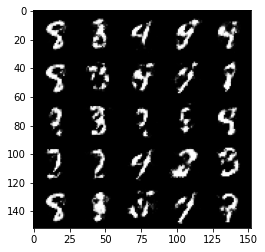

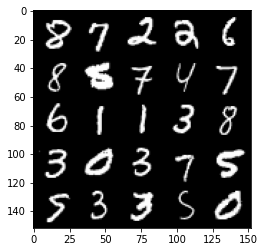

Step 60500: Generator loss: 1.6989469268321982, discriminator loss: 0.3728821966648104


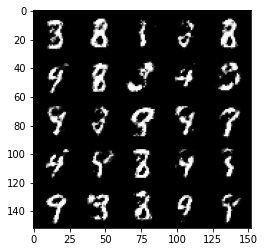

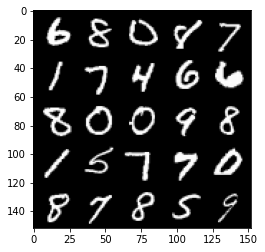

Step 61000: Generator loss: 1.6691624641418468, discriminator loss: 0.37846999388933183


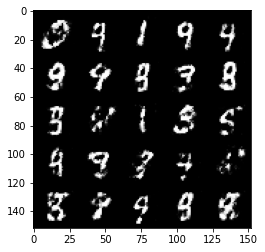

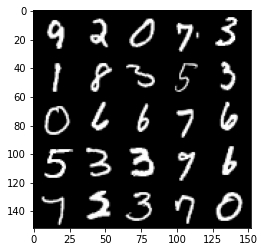

Step 61500: Generator loss: 1.5982447946071627, discriminator loss: 0.4130004531741142


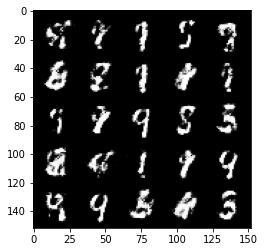

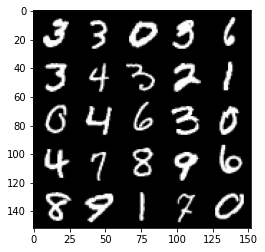

Step 62000: Generator loss: 1.633604287624358, discriminator loss: 0.3889886226058011


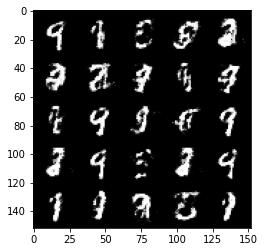

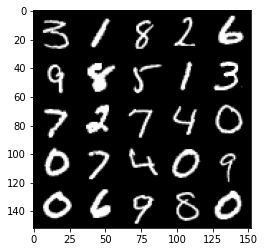

Step 62500: Generator loss: 1.6922184641361255, discriminator loss: 0.3853049348592762


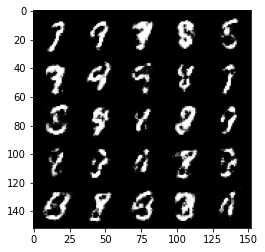

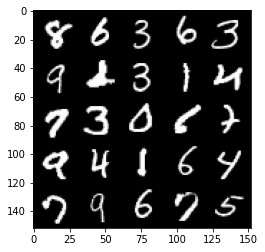

Step 63000: Generator loss: 1.6885955593585975, discriminator loss: 0.3795707111954692


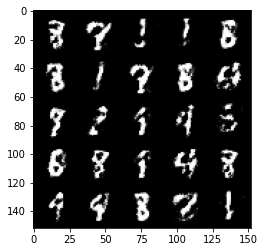

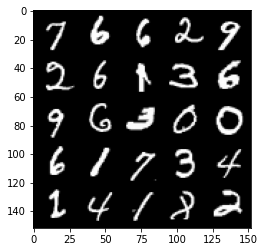

Step 63500: Generator loss: 1.73451417207718, discriminator loss: 0.36846667706966396


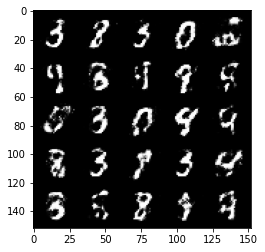

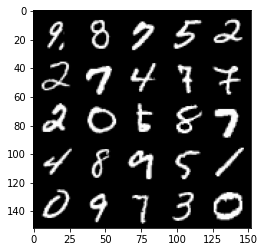

Step 64000: Generator loss: 1.6551844947338097, discriminator loss: 0.3955508962869647


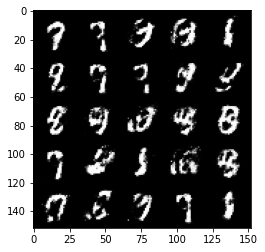

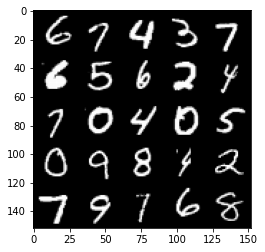

Step 64500: Generator loss: 1.785777856826783, discriminator loss: 0.35408919924497584


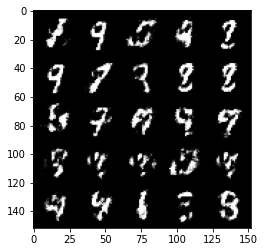

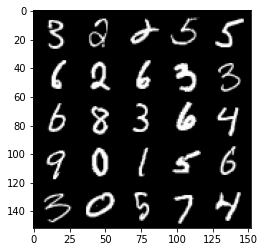

Step 65000: Generator loss: 1.6655376443862906, discriminator loss: 0.3876575467586513


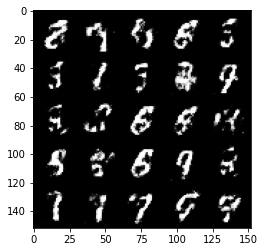

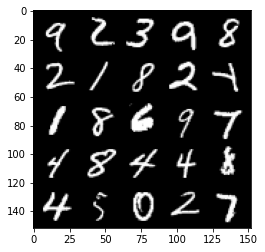

Step 65500: Generator loss: 1.6197370197772976, discriminator loss: 0.3964618998765945


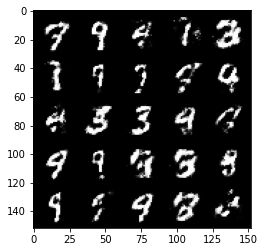

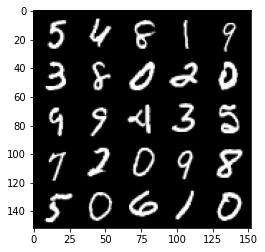

Step 66000: Generator loss: 1.580143989562986, discriminator loss: 0.40691733950376524


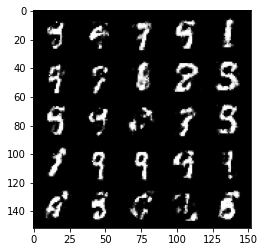

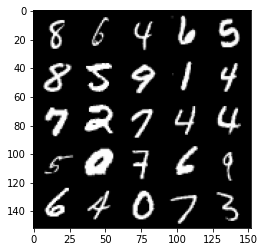

Step 66500: Generator loss: 1.5629974186420441, discriminator loss: 0.40884444397687986


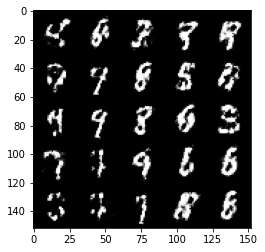

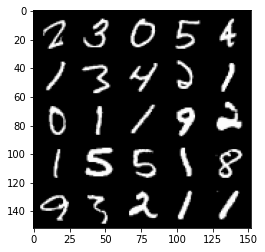

Step 67000: Generator loss: 1.5889856414794934, discriminator loss: 0.4061631841063501


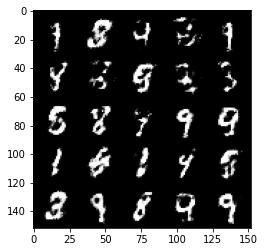

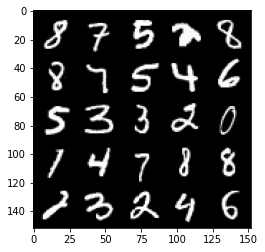

Step 67500: Generator loss: 1.5091817731857293, discriminator loss: 0.41932421511411705


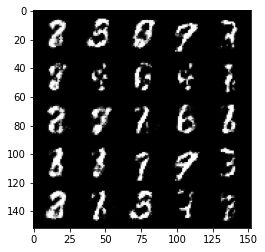

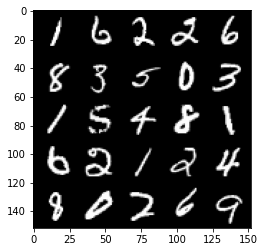

Step 68000: Generator loss: 1.4781954052448274, discriminator loss: 0.42678293508291226


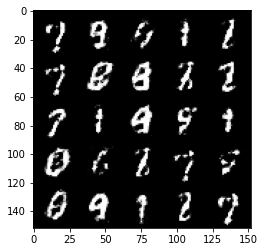

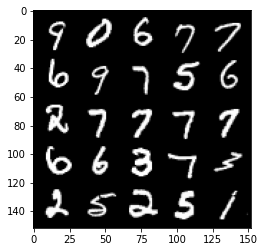

Step 68500: Generator loss: 1.5722096960544576, discriminator loss: 0.39925088691711413


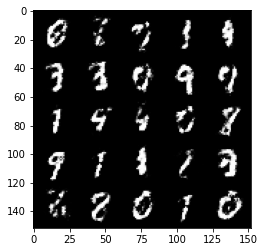

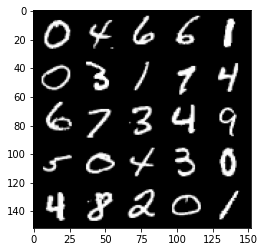

Step 69000: Generator loss: 1.558091449499132, discriminator loss: 0.4094330061078074


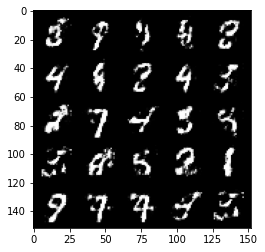

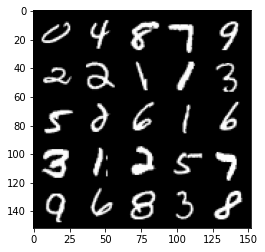

Step 69500: Generator loss: 1.5155739033222204, discriminator loss: 0.42423839408159264


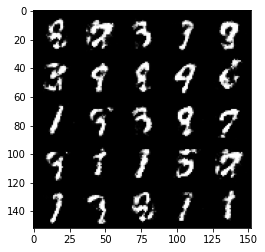

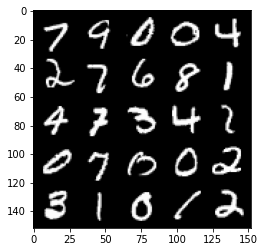

Step 70000: Generator loss: 1.4914984102249134, discriminator loss: 0.4327483481168745


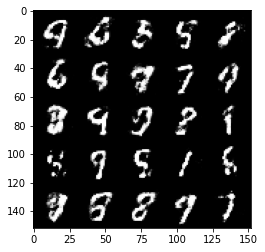

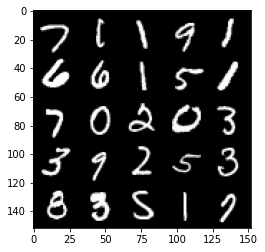

Step 70500: Generator loss: 1.4677089567184436, discriminator loss: 0.4309833134412765


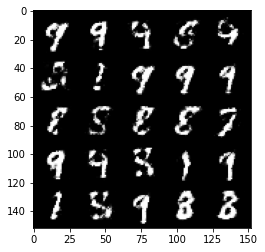

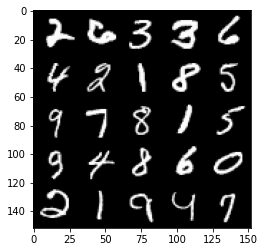

Step 71000: Generator loss: 1.480674494504928, discriminator loss: 0.43287186467647554


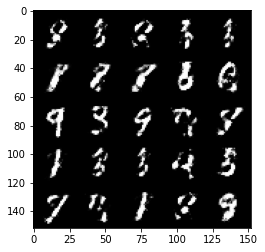

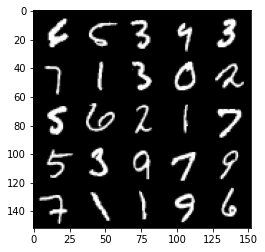

Step 71500: Generator loss: 1.4374274036884302, discriminator loss: 0.44570941889286025


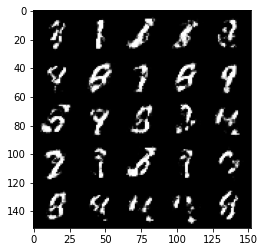

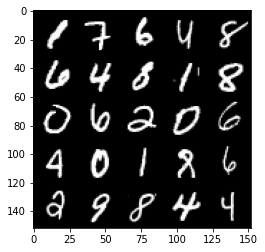

Step 72000: Generator loss: 1.4665735876560202, discriminator loss: 0.41889705258607823


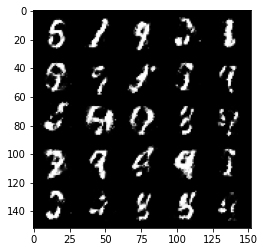

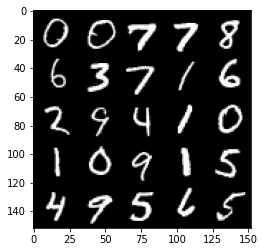

Step 72500: Generator loss: 1.5123474507331844, discriminator loss: 0.41368908011913347


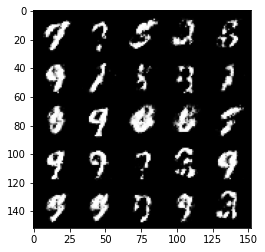

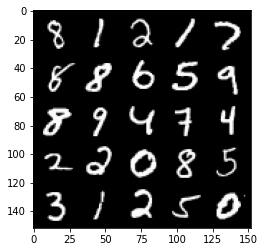

Step 73000: Generator loss: 1.4394672834873188, discriminator loss: 0.4411185299158098


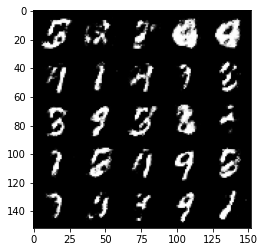

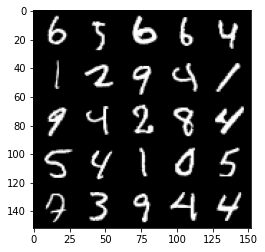

Step 73500: Generator loss: 1.4507809636592874, discriminator loss: 0.4356160175204278


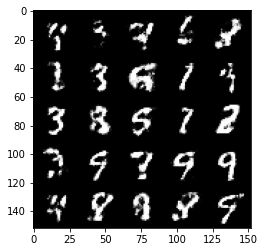

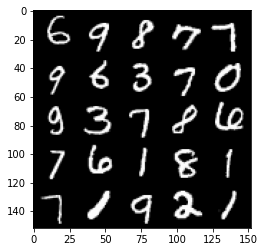

Step 74000: Generator loss: 1.424418010711669, discriminator loss: 0.450761767089367


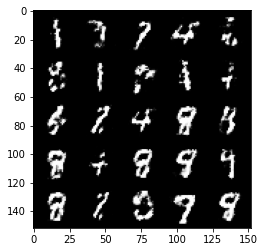

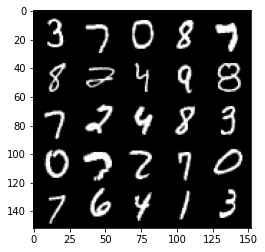

Step 74500: Generator loss: 1.4337803866863263, discriminator loss: 0.46025388854742083


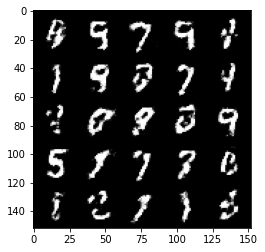

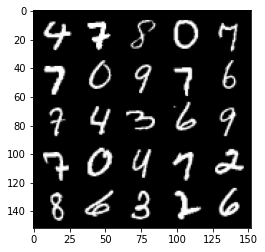

Step 75000: Generator loss: 1.3464156937599165, discriminator loss: 0.4782783833742141


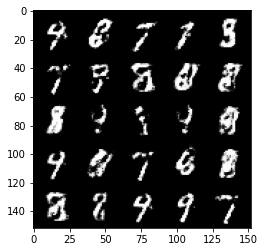

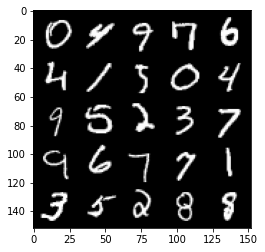

Step 75500: Generator loss: 1.3635836551189415, discriminator loss: 0.46448325502872495


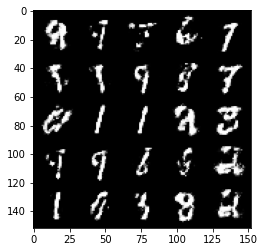

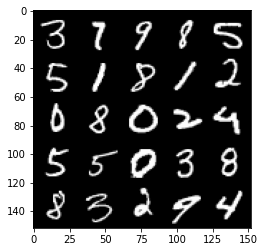

Step 76000: Generator loss: 1.364569693565367, discriminator loss: 0.46345737141370763


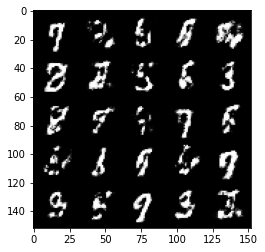

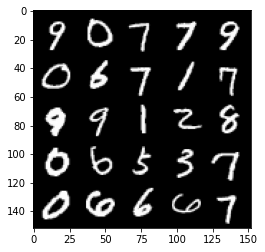

Step 76500: Generator loss: 1.3699338572025297, discriminator loss: 0.4667081434130665


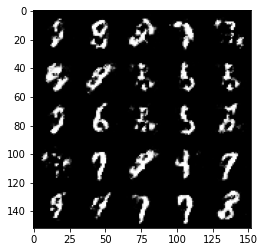

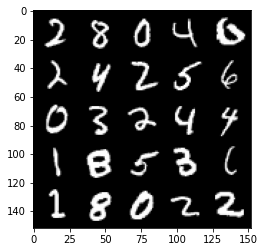

Step 77000: Generator loss: 1.3611746644973766, discriminator loss: 0.47483472484350187


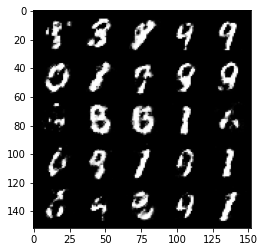

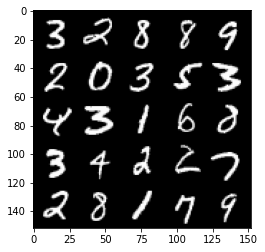

Step 77500: Generator loss: 1.4009263210296623, discriminator loss: 0.43741388243436846


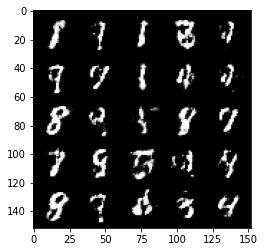

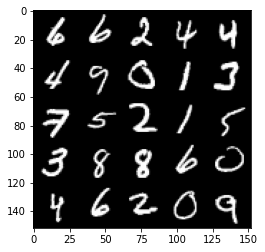

Step 78000: Generator loss: 1.4018680195808397, discriminator loss: 0.468450699806214


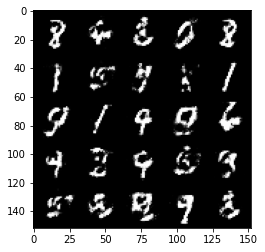

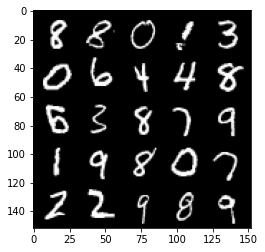

Step 78500: Generator loss: 1.3548859212398507, discriminator loss: 0.4715136497020724


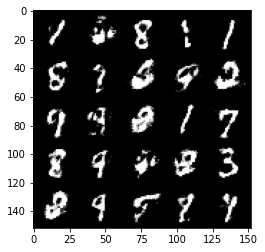

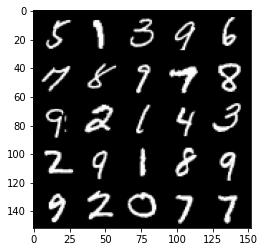

Step 79000: Generator loss: 1.3742437491416928, discriminator loss: 0.465220828652382


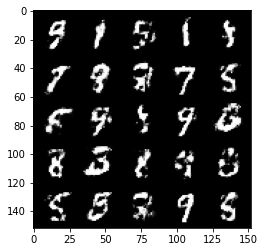

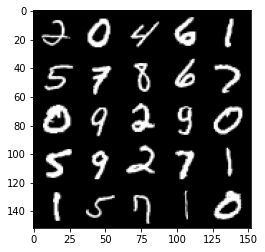

Step 79500: Generator loss: 1.3382123651504514, discriminator loss: 0.4788303323388098


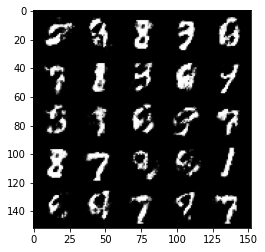

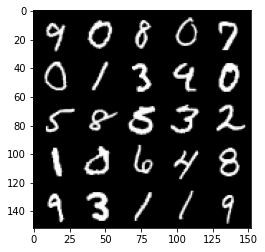

Step 80000: Generator loss: 1.3258190574645976, discriminator loss: 0.4687918822169305


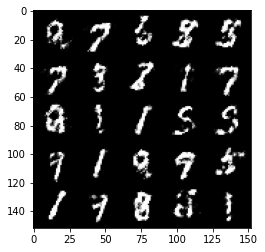

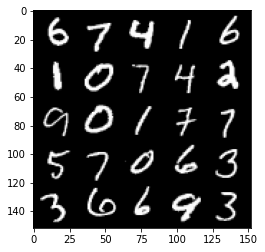

Step 80500: Generator loss: 1.3964462380409228, discriminator loss: 0.4423032118678094


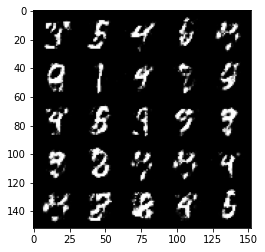

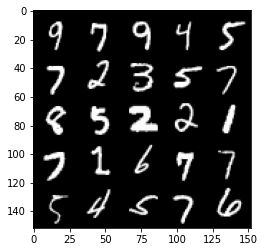

Step 81000: Generator loss: 1.4130906610488876, discriminator loss: 0.45047279733419426


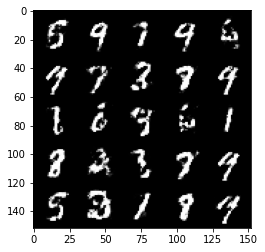

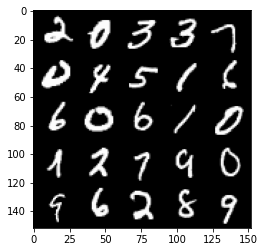

Step 81500: Generator loss: 1.3531654891967777, discriminator loss: 0.4599888079762457


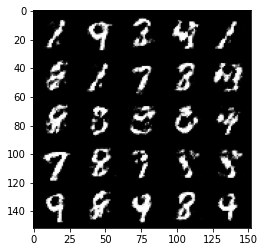

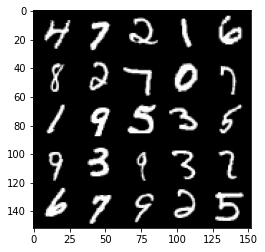

Step 82000: Generator loss: 1.455741703987122, discriminator loss: 0.43050763064622855


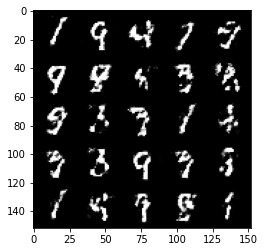

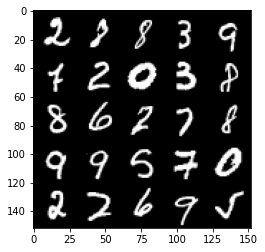

Step 82500: Generator loss: 1.4560432121753686, discriminator loss: 0.43785863792896285


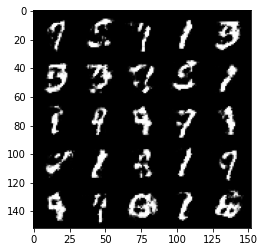

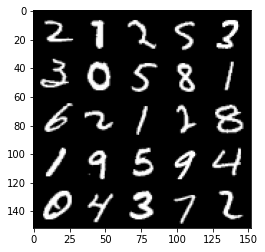

Step 83000: Generator loss: 1.4526438586711883, discriminator loss: 0.42449399882555017


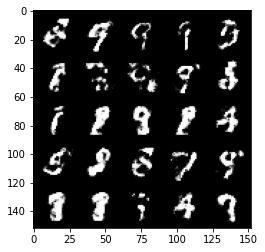

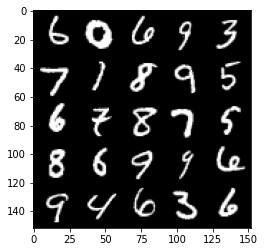

Step 83500: Generator loss: 1.4182777152061488, discriminator loss: 0.4398994380831719


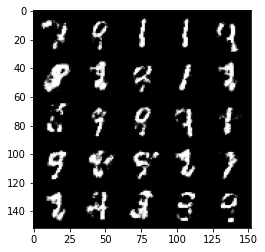

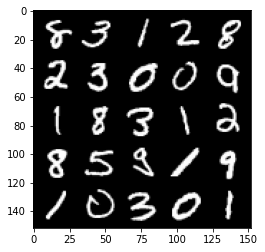

Step 84000: Generator loss: 1.3194321320056923, discriminator loss: 0.4819148795008666


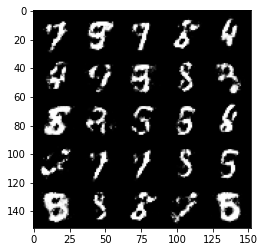

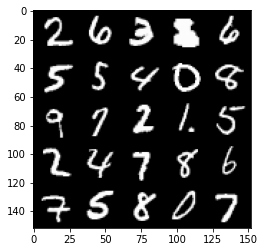

Step 84500: Generator loss: 1.3633517503738393, discriminator loss: 0.4513296835422516


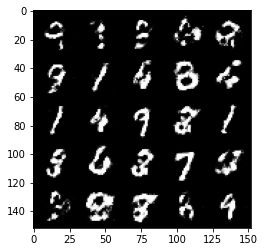

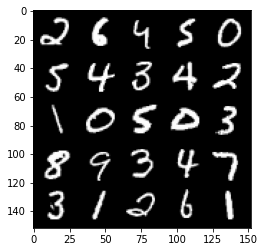

Step 85000: Generator loss: 1.3810353565216076, discriminator loss: 0.45637089467048647


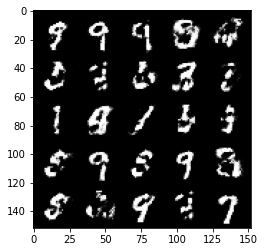

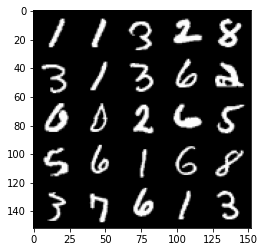

Step 85500: Generator loss: 1.3425121786594394, discriminator loss: 0.4631927012801176


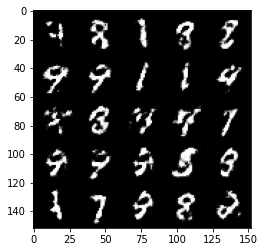

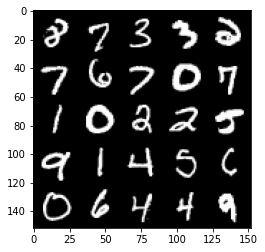

Step 86000: Generator loss: 1.3506539354324332, discriminator loss: 0.4678221615552897


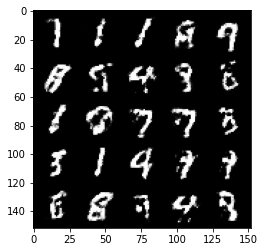

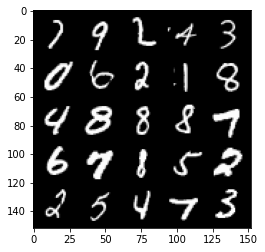

Step 86500: Generator loss: 1.3251485455036176, discriminator loss: 0.46655165308713925


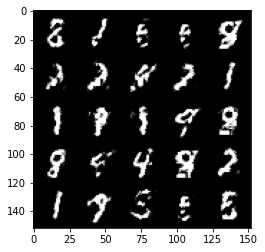

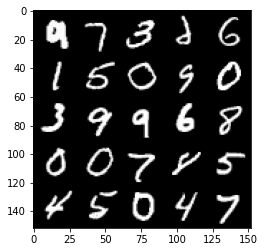

Step 87000: Generator loss: 1.2997619397640232, discriminator loss: 0.47300824314355827


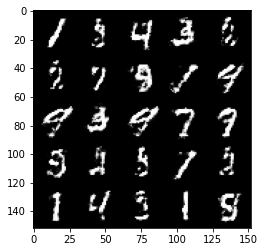

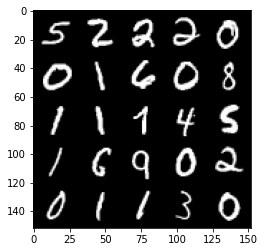

Step 87500: Generator loss: 1.2307879855632786, discriminator loss: 0.49266113752126695


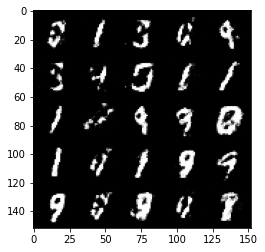

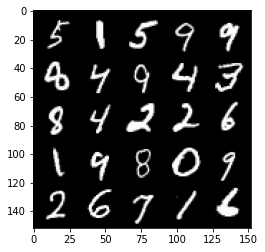

Step 88000: Generator loss: 1.2081272628307356, discriminator loss: 0.5134299662709235


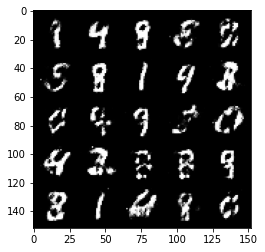

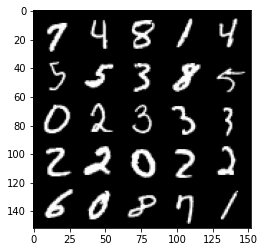

Step 88500: Generator loss: 1.2402895653247834, discriminator loss: 0.49980071693658845


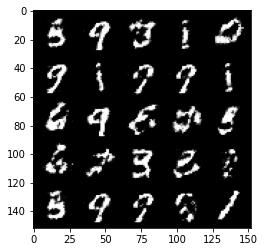

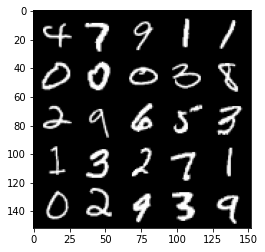

Step 89000: Generator loss: 1.2883610796928395, discriminator loss: 0.4819586228132248


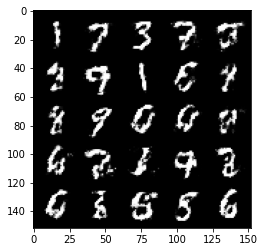

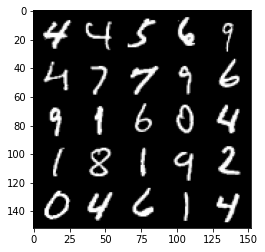

Step 89500: Generator loss: 1.3265320353508003, discriminator loss: 0.46680457270145453


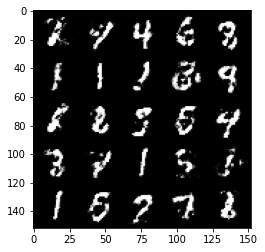

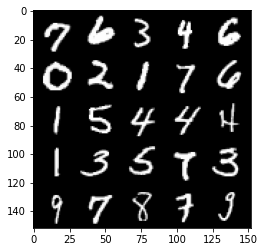

Step 90000: Generator loss: 1.3427727532386788, discriminator loss: 0.4651163161993021


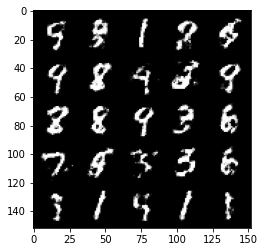

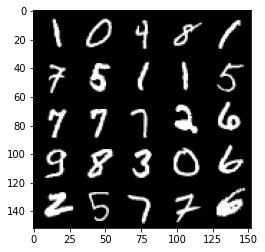

Step 90500: Generator loss: 1.2527793018817899, discriminator loss: 0.4870817734003068


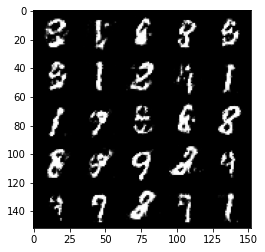

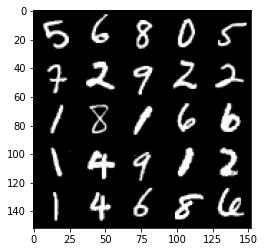

Step 91000: Generator loss: 1.2716200141906733, discriminator loss: 0.469232533991337


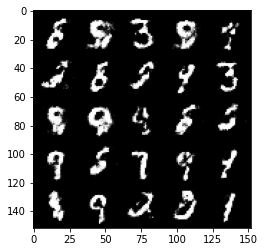

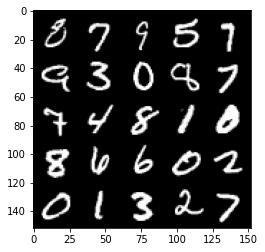

Step 91500: Generator loss: 1.2783618469238287, discriminator loss: 0.4693555593490602


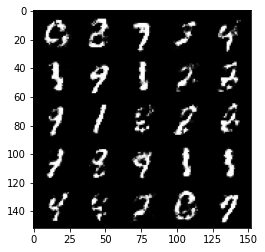

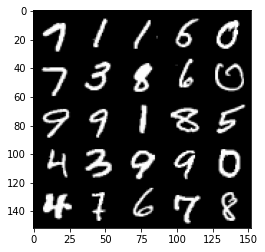

Step 92000: Generator loss: 1.2519608957767505, discriminator loss: 0.4833346408009525


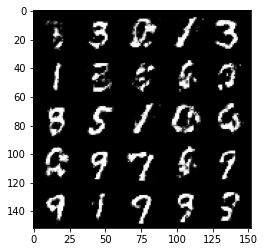

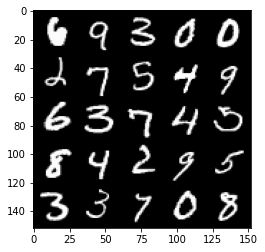

Step 92500: Generator loss: 1.206387269735335, discriminator loss: 0.5087104559540748


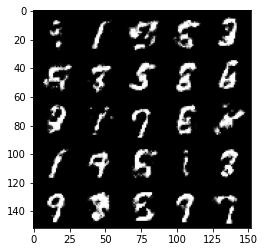

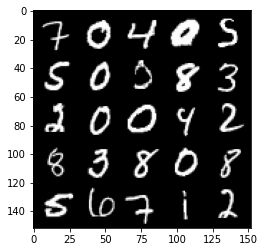

Step 93000: Generator loss: 1.2227879567146296, discriminator loss: 0.48573559498786956


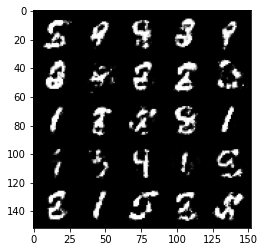

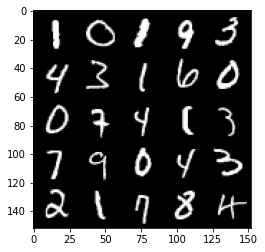

Step 93500: Generator loss: 1.2275516686439505, discriminator loss: 0.508103343129158


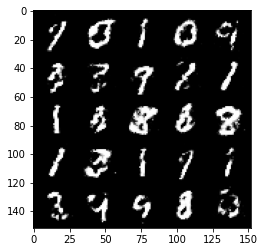

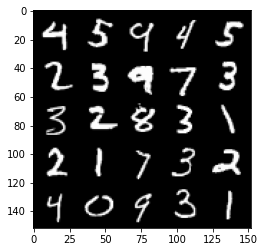

In [63]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
            gen_loss.backward(retain_graph=True)
            gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**